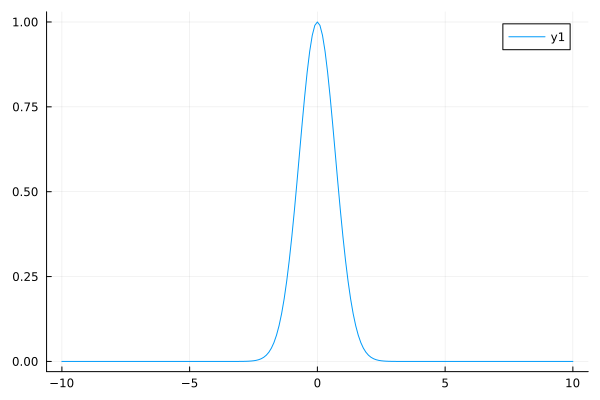

In [31]:
using Printf
using Statistics
using Plots
using SparseArrays: spdiagm
using LinearAlgebra

dx=0.1
dt=10
L=10
T=20000
h_bar=1e-3

x=collect(-L:dx:L)
t=collect(0:dt:T)
n=length(x)
m= length(t)

# Defining the function
function f(x)
    return exp(-x^2)
end

plot(x,f.(x)) #Ploting the function

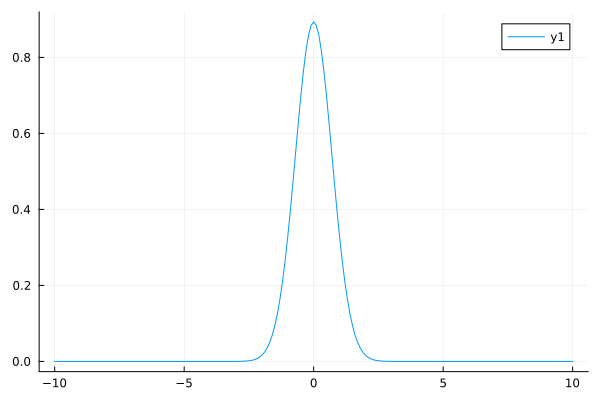

In [32]:
#  Taking the absolute value of it.
function prob_dens(x)
    return(f(x)^2)
end

# Integrating using simpson method
function simpson(func,a,b,N)
    h=(b-a)/(N-1)
    sum= (func(a)+func(b))

    for i=1:2:N-1
        sum += 4*func(a+ i*h)
    end
    
    for i=2:2:N-2
        sum += 2*func(a+ i*h)
    end
    return h*(sum)/3
end

# Normalisation of the wavefunction
N=simpson(prob_dens,-10,10,1001)

function norm_psi(x)
    return f(x)/(N^(.5))
end

plot(x,norm_psi.(x))

In [33]:
# Evolution using 3-point formula (particle in a box)


D_1= spdiagm(n,n, 1 => ones(n-1), 0=>ones(n)*-1)
D_2=spdiagm(n,n, 1=> ones(n-1) ,0=> ones(n)*-2, -1=>ones(n-1))

plot(x,D_2*norm_psi.(x),xlabel='x', title="2nd order derivative of wavefunction")

A=Matrix(1I,n,n)+(1im/2)*dt*D_2
B=Matrix(1I,n,n)-(1im/2)*dt*D_2
C=inv(A)

psi_matrix = norm_psi.(x)
psi_prev = norm_psi.(x)
for i in 0:dt:T
    psi_forward = C*B*psi_prev
    psi_matrix = hcat(psi_matrix,psi_forward)
    psi_prev = psi_forward
end
prob_matrix = abs2.(psi_matrix)




201×2002 Matrix{Float64}:
 1.10419e-87  5.10308e-27  6.98524e-24  …  0.00103713  0.00195951  0.00292677
 5.9093e-86   2.06164e-26  2.80239e-23     0.00393988  0.00746263  0.0112015
 3.03848e-84  4.79771e-26  6.43869e-23     0.00814299  0.0154783   0.0234135
 1.50108e-82  9.23947e-26  1.21619e-22     0.0128869   0.0245778   0.0375402
 7.12494e-81  1.67437e-25  2.14897e-22     0.017429    0.0332828   0.051362
 3.24927e-79  3.02681e-25  3.77506e-22  …  0.0212393   0.0404061   0.0629041
 1.4237e-77   5.56901e-25  6.74704e-22     0.0241253   0.0452983   0.0708082
 5.9935e-76   1.04206e-24  1.22792e-21     0.0262597   0.0479431   0.0745538
 2.42421e-74  1.96846e-24  2.25888e-21     0.0281144   0.0488918   0.0744874
 9.4208e-73   3.73078e-24  4.1716e-21      0.030332    0.0490713   0.0716641
 3.5175e-71   7.0721e-24   7.70471e-21  …  0.0335727   0.0495269   0.0675506
 1.26185e-69  1.33956e-23  1.42133e-20     0.0383743   0.051171    0.0636682
 4.34921e-68  2.53552e-23  2.61883e-20     0.04504

[ Info: Saved animation to c:\Users\91742\Documents\GitHub\numerical_methods_2023\tmp.gif


Plots.AnimatedGif("c:\\Users\\91742\\Documents\\GitHub\\numerical_methods_2023\\tmp.gif")
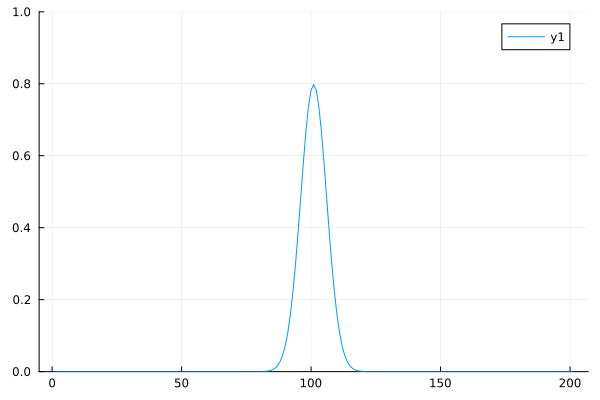

In [34]:
# Plotting the Evolution

@gif for i ∈ 1:size(prob_matrix)[2]
    plot(prob_matrix[:,i])
    ylims!(0,1)
end

In [38]:
# Crank-Nichelson Method

r = 5
for t in 1:r
    A = [2*i^(2*j)//factorial(2*j) for i=1:r, j=1:r]
    B = Rational.(hcat(-2*ones(r), Matrix(I, r, r)))
    C = inv(A)*B
end
println(C[1,:])



Rational{Int64}[-5269//1800, 5//3, -5//21, 5//126, -5//1008, 1//3150]


In [39]:
h = 6.62607015e-34;  # Planck's contant 
h_bar = h / (2*pi); 
b = (1im/2)*h_bar*(dt/dx^2)
a_j = (b/(-2))C[1,:]

6-element Vector{ComplexF64}:
  0.0 + 7.717415148857775e-32im
 -0.0 - 4.3940492401923184e-32im
  0.0 + 6.27721320027474e-33im
 -0.0 - 1.0462022000457899e-33im
  0.0 + 1.3077527500572374e-34im
 -0.0 - 8.36961760036632e-36im

In [46]:
d_j = [1+a_j[1] for i=1:n]
A = spdiagm(n,n, 0 => d_j)
for i in 1:r
    A+=spdiagm(n,n, i => ones(n-i)*a_j[i+1])
    A+=spdiagm(n,n, -1*i => ones(n-i)*a_j[i+1])
end
A


201×201 SparseArrays.SparseMatrixCSC{ComplexF64, Int64} with 2181 stored entries:
⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷⣄⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠙⢿⣷

In [47]:
psi_matrixcn = norm_psi.(x)
psi_prevcn = norm_psi.(x)
A = Matrix(A)
A_inv = inv(A)
A_conj = conj.(A)
for i in 0:dt:T
    psi_forwardcn = A_inv*A_conj*psi_prevcn
    psi_matrixcn = hcat(psi_matrixcn,psi_forwardcn)
    psi_prevgn = psi_forwardcn
end
prob_matrixcn = abs2.(psi_matrixcn)

201×2002 Matrix{Float64}:
 1.10419e-87  1.10419e-87  1.10419e-87  …  1.10419e-87  1.10419e-87
 5.9093e-86   5.9093e-86   5.9093e-86      5.9093e-86   5.9093e-86
 3.03848e-84  3.03848e-84  3.03848e-84     3.03848e-84  3.03848e-84
 1.50108e-82  1.50108e-82  1.50108e-82     1.50108e-82  1.50108e-82
 7.12494e-81  7.12494e-81  7.12494e-81     7.12494e-81  7.12494e-81
 3.24927e-79  3.24927e-79  3.24927e-79  …  3.24927e-79  3.24927e-79
 1.4237e-77   1.4237e-77   1.4237e-77      1.4237e-77   1.4237e-77
 5.9935e-76   5.9935e-76   5.9935e-76      5.9935e-76   5.9935e-76
 2.42421e-74  2.42421e-74  2.42421e-74     2.42421e-74  2.42421e-74
 9.4208e-73   9.4208e-73   9.4208e-73      9.4208e-73   9.4208e-73
 3.5175e-71   3.5175e-71   3.5175e-71   …  3.5175e-71   3.5175e-71
 1.26185e-69  1.26185e-69  1.26185e-69     1.26185e-69  1.26185e-69
 4.34921e-68  4.34921e-68  4.34921e-68     4.34921e-68  4.34921e-68
 ⋮                                      ⋱  ⋮            
 1.26185e-69  1.26185e-69  1.26185e-69

[ Info: Saved animation to c:\Users\91742\Documents\GitHub\numerical_methods_2023\tmp.gif


Plots.AnimatedGif("c:\\Users\\91742\\Documents\\GitHub\\numerical_methods_2023\\tmp.gif")
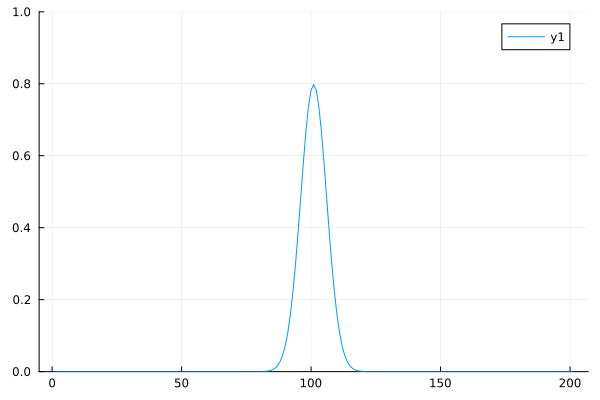

In [48]:
@gif for i ∈ 1:size(prob_matrix)[2]
    plot(prob_matrix[:,i])
    ylims!(0,1)
end